<a href="https://colab.research.google.com/github/samtbeardsley/Food_Porn/blob/master/02_Exploratory_Data_Analysis_Colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from skimage import io
from skimage import color
from tqdm import tqdm
from sklearn.cluster import KMeans
from yellowbrick.cluster import SilhouetteVisualizer

%matplotlib inline

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


In [29]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Introduction

In the modern digital world images are everywhere and we use them to communicate. Sharing experiences and ideas with all; from friends and family to customers and followers. Within this communication, one of the things we photograph most is food. The hashtags #food, #foodporn, #instafood, #yummy and #foodie are 5 of the top 100 hashtags on Instagram and, combined, have been used over 1 billion times. In spite of all of this sharing and the rise of the food blog, we also see cookbooks continue to be a medium in which we explore food. Undeniably, food is a necessary part of our everyday lives, but something that also ties us culturally and emotionally.

In this notebook I preform exploratory data analysis of food images scraped from Reddit's [FoodPorn](https://www.reddit.com/r/FoodPorn/) and [shittyfoodporn](https://www.reddit.com/r/FoodPorn/) subreddits. Going forward I will refere to these as FP and SFP respectively. In the following notebook I will build a classification model with transfer learning and a Convolutional Neural Network. I've built a data set of 40,000+ images, but, for the sake of time and computational power, I will only examine the 500 images with the most votes from each subreddit.

# Sample Images

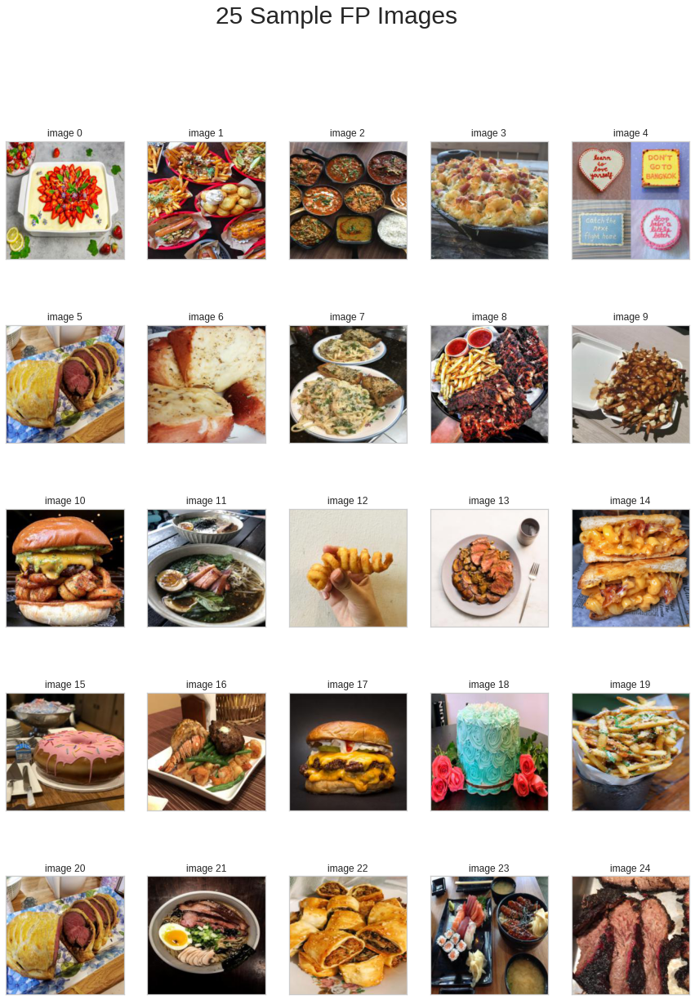

In [ ]:
rows = 5
cols = 5
axes=[]
fig=plt.figure(figsize=(15,20))

fp_path = 'drive/My Drive/FoodPorn/FP500_224x224'
fp_list = os.listdir(fp_path)

for a in range(rows*cols):
    np.random.seed(a)
    img = io.imread(f'{fp_path}/{fp_list[np.random.randint(len(fp_list))]}')
    axes.append(fig.add_subplot(rows, cols, a+1))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.title(f'image {a}')
_ = fig.suptitle('25 Sample FP Images', fontsize=30)

FP images are appetizing, and aestheticly pleasing; Even the poutin (image 9) or the mac & cheese bacon sandwich (image 14). Some are even artistic (image 0 and 18). But we also see some that are simply good food that the user wished to share, such as the perfectly fried curly fry (image 12), with no attention to the presentation - this fry is in the user's hand and their shadow is cast over the image.

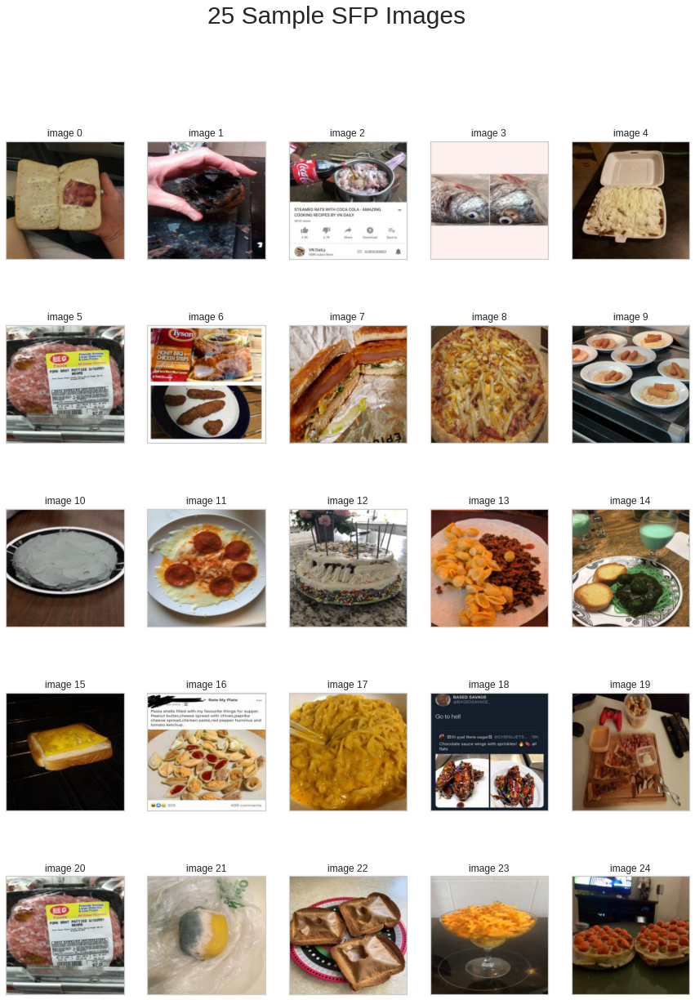

In [ ]:
rows = 5
cols = 5
axes=[]
fig=plt.figure(figsize=(15,20))

sfp_path = 'drive/My Drive/FoodPorn/SFP500_224x224'
sfp_list = os.listdir(sfp_path)

for a in range(rows*cols):
    np.random.seed(a)
    img = io.imread(f'{sfp_path}/{sfp_list[np.random.randint(len(sfp_list))+1]}')
    axes.append(fig.add_subplot(rows, cols, a+1))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.title(f'image {a}')
_ = fig.suptitle('25 Sample SFP Images', fontsize=30)                

The posts on SFP have a different thematic variety to them. They tend to be darker with muted colors and little attention paid to the asectics of the image. There are odd/gross combinations, such as chocolate and sprinkle chicken wings (image 18) or pasta shells filled with peanut butter/cheese spread/chicken paste/red pepper hummus/ketchup (image 10). Naturally there are "fails" (images 12 & 14), food gone bad (image 21) and under cooked food (image 7). Also present are lazy or "poor man's" dinner, for example pizza with no crust (image 11), or a single peice of american cheese on white bread (image 15). Another theme in the sample images is food that is well executed but a terrible idea (not present in these samples) such as, one of my personal favorites, a pasta and hot dog jello mold:

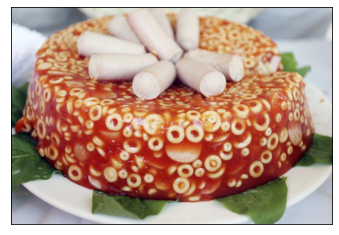

In [ ]:
img = io.imread('8mrrf7.jpg')
_ = plt.imshow(img)
_ = plt.xticks([])
_ = plt.yticks([])

#Labeling

#### FP

As part of data exploration I've labeled the images, with a different framework for each subreddit. The images in FP were given 3 labels. The first label is if the food in the image is professionally or homemade. The second label describes what type of dish is show with the labels of meat, vegetables, dessert, drink or meal where meal indicates that there are multiple foods being shown. For example, a steak with potatoes would be a meal while just a steak with nothing else present would be meat. Some notable foods that I felt belong in the meal category are hamburgers, pizza, sandwiches, and french fries with a significant number of toppings. Lastly, the third lable I applied to the FP subreddit images was of the primary ingredient.

In [65]:
fp500_label_url = 'https://raw.githubusercontent.com/samtbeardsley/Food_Porn/master/Data/fp500_labels.csv'
sfp500_label_url = 'https://raw.githubusercontent.com/samtbeardsley/Food_Porn/master/Data/sfp500_labels.csv'
fp500_label_df = pd.read_csv(fp500_label_url, index_col=0)
sfp500_label_df = pd.read_csv(sfp500_label_url, index_col=0)

In [66]:
fp500_label_df['num'] = 1
fp_labels = fp500_label_df.groupby(by=['preparation','type','main_ingredient'], as_index=False).sum()

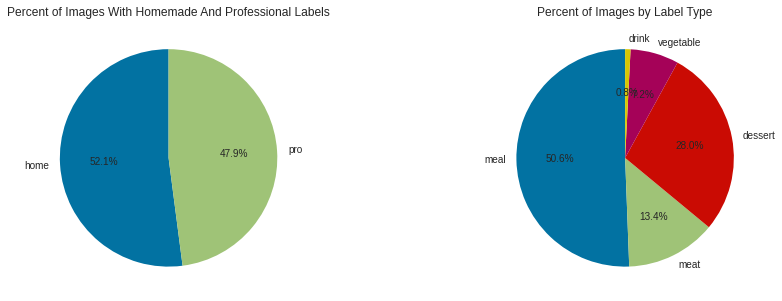

In [73]:
f = plt.figure(figsize=(15,5))
ax1 = f.add_subplot(121)
labels = 'home','pro'
sizes = [fp_labels.num[fp_labels.preparation == 'home'].sum(), fp_labels.num[fp_labels.preparation == 'pro'].sum()]
_ = plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
_ = plt.title('Percent of Images With Homemade And Professional Labels')

ax2 = f.add_subplot(122)
labels = 'meal','meat','dessert','vegetable','drink'
sizes = [fp_labels.num[fp_labels['type'] == 'meal'].sum(), fp_labels.num[fp_labels['type'] == 'meat'].sum(),
         fp_labels.num[fp_labels['type'] == 'des'].sum(), fp_labels.num[fp_labels['type'] == 'veg'].sum(),
         fp_labels.num[fp_labels['type'] == 'drink'].sum()]
_ = plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
_ = plt.title('Percent of Images by Label Type')

Homemade versus profesionally made food images are practically even with only a 4 point difference between them. Meal images are the most common accounting for 50% of the images followed by desserts at 28%. This makes sense as you typically only have one thing for dessert whereas, unless the execution is particularly spectacular of a single item, you would present a complete dish.

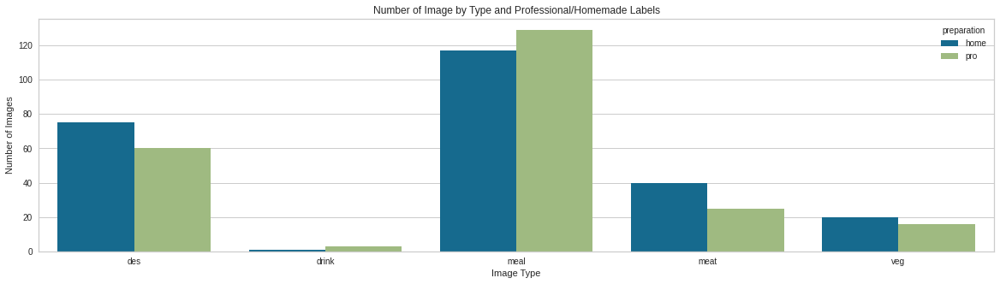

In [68]:
f = plt.figure(figsize=(20,5))
_ = sns.barplot(data=fp_labels[(fp_labels.preparation == 'home') | (fp_labels.preparation == 'pro')], y='num', x='type', hue='preparation', estimator=np.sum, ci=None)
_ = plt.title('Number of Image by Type and Professional/Homemade Labels')
_ = plt.ylabel('Number of Images')
_ = plt.xlabel('Image Type')

Examining both the Type and Professional/Homemade labels combined shows that the dessert, meat and vegetable labels are typically homemade, while drinks and meals are more often professionally made.

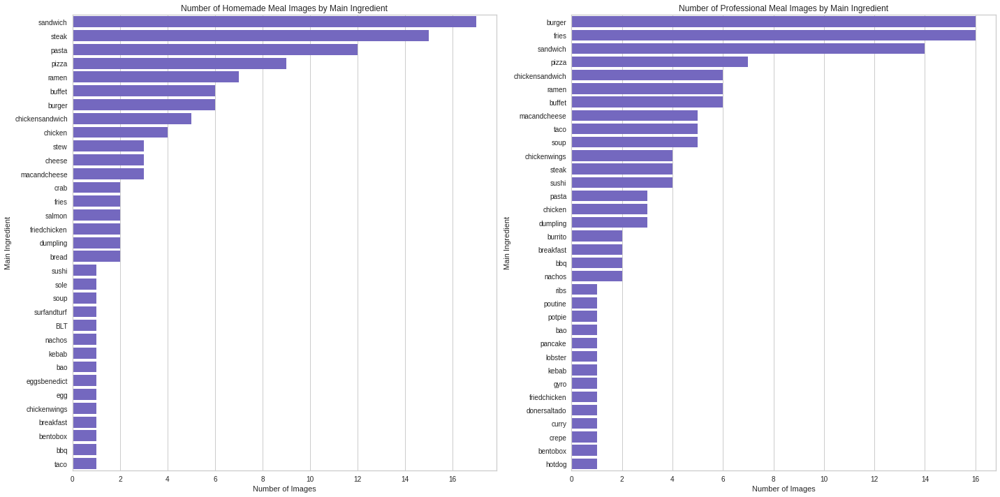

In [69]:
f = plt.figure(figsize=(20,10))
ax1 = f.add_subplot(121)
data = fp_labels[(fp_labels['preparation'] == 'home') & (fp_labels['type'] == 'meal')].sort_values('num', ascending=False)
_ = sns.barplot(data=data, y='main_ingredient', x='num', color='slateblue')
_ = plt.xlabel('Number of Images')
_ = plt.ylabel('Main Ingredient')
_ = plt.title('Number of Homemade Meal Images by Main Ingredient')

ax1 = f.add_subplot(122)
data = fp_labels[(fp_labels['preparation'] == 'pro') & (fp_labels['type'] == 'meal')].sort_values('num', ascending=False)
_ = sns.barplot(data=data, y='main_ingredient', x='num', color='slateblue')
_ = plt.title('Bar Chart of Main Ingredient For Professional & Meal Labels')
_ = plt.xlabel('Number of Images')
_ = plt.ylabel('Main Ingredient')
_ = plt.title('Number of Professional Meal Images by Main Ingredient')
plt.tight_layout()

Due to the size of the data set there are a number of one off items. Most items are similarly represented in the professional and homemade labels, but there are some items of note. Sandwiches and pizza are popular across both labels. While burgers are highly present under both labels, but there are over two and a half times more professionally labeled burgers than there are homemade. Fries have the largest difference between the two labels with only two entries in the homemade label, but 16 in the professional label. Fries also ties burgers for the most labeled main ingredient. Note that an image with burgers and fries would be labeled burger. Since fries are a popular addition to a burger in a meal, it is clear that french fries are very popular. On the otherhand, 
steak has nearly three times more homemade images than prrofessional.

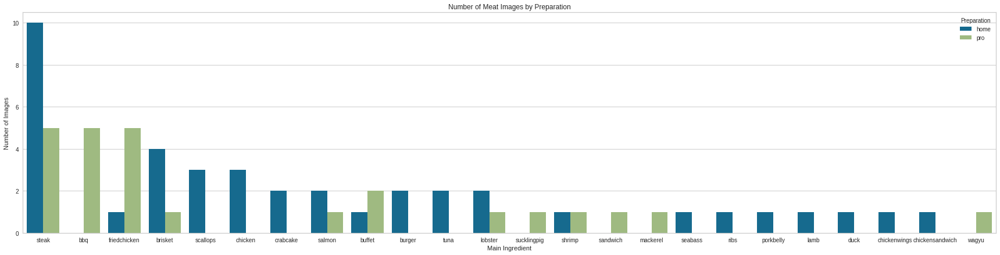

In [70]:
f = plt.figure(figsize=(30,7))
data = fp_labels[(fp_labels['type'] == 'meat') & ~(fp_labels['preparation'] == 'none')].sort_values('num', ascending=False)
_ = sns.barplot(data=data, y='num', x='main_ingredient', hue='preparation', orient='v')
_ = plt.ylabel('Number of Images')
_ = plt.xlabel('Main Ingredient')
_ = plt.title('Number of Meat Images by Preparation')
_ = plt.legend(title='Preparation', loc='upper right')

Once again, the steak images are primarily homemade and account for the most images. However, bbq (multiple items) and fried chicken are overwhelmingly professionally made. Seafood items (scallops, crabcake, salmon, etc.) are most often homemade.

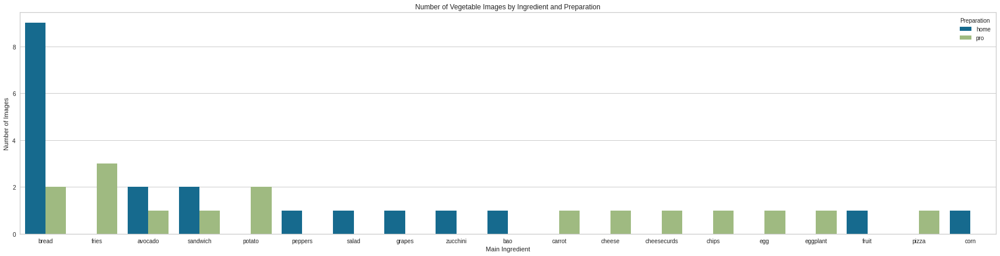

In [64]:
f = plt.figure(figsize=(30,7))
data = fp_labels[(fp_labels['type'] == 'veg') & ~(fp_labels['preparation'] == 'none')].sort_values('num', ascending=False)
_ = sns.barplot(data=data, y='num', x='main_ingredient', hue='preparation', orient='v')
_ = plt.ylabel('Number of Images')
_ = plt.xlabel('Main Ingredient')
_ = plt.title('Number of Vegetable Images by Ingredient and Preparation')
_ = plt.legend(title='Preparation', loc='upper right')

There are only a few images with the vegetable label and they are diverse. That said, bread, particularly homemade bread, has the highest representation in the vegetable label set.

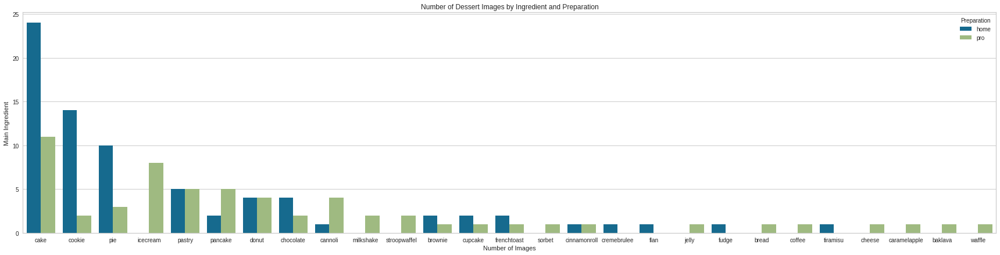

In [63]:
f = plt.figure(figsize=(30,7))
data = fp_labels[(fp_labels['type'] == 'des') & ~(fp_labels['preparation'] == 'none')].sort_values('num', ascending=False)
_ = sns.barplot(data=data, y='num', x='main_ingredient', hue='preparation', orient='v')
_ = plt.xlabel('Number of Images')
_ = plt.ylabel('Main Ingredient')
_ = plt.title('Number of Dessert Images by Ingredient and Preparation')
_ = plt.legend(title='Preparation', loc='upper right')

Lastly, for the FP subreddit, there are desserts. Once again this label set is diverse, but cakes, cookies, and pies represent the majority of the labels, and are overwhelmingly homemade.

#### SFP

The labeling framework for the SFP subreddit is a bit subjective, but simpler with each image given one out of a possible seven labels. Those labels are: gross, bad execution, good execution, overkill, odd, burnt, and poor man. Examples of each are below.

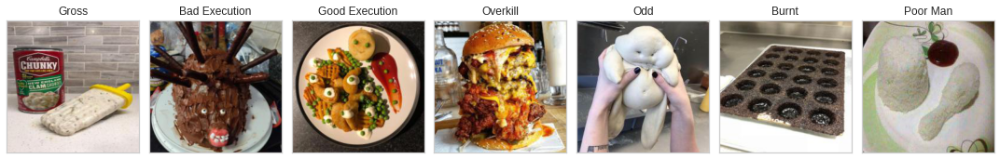

In [34]:
f = plt.figure(figsize=(15,20))
ax1 = f.add_subplot(171)
_ = plt.imshow(io.imread('drive/My Drive/FoodPorn/SFP500_224x224/bzf111.jpg'))
_ = plt.xticks([]), plt.yticks([]), plt.title('Gross')
ax2 = f.add_subplot(172)
_ = plt.imshow(io.imread('drive/My Drive/FoodPorn/SFP500_224x224/cuu6go.jpg'))
_ = plt.xticks([]), plt.yticks([]), plt.title('Bad Execution')
ax3 = f.add_subplot(173)
_ = plt.imshow(io.imread('drive/My Drive/FoodPorn/SFP500_224x224/9gsugx.jpg'))
_ = plt.xticks([]), plt.yticks([]), plt.title('Good Execution')
ax4 = f.add_subplot(174)
_ = plt.imshow(io.imread('drive/My Drive/FoodPorn/SFP500_224x224/bnu7l7.jpg'))
_ = plt.xticks([]), plt.yticks([]), plt.title('Overkill')
ax5 = f.add_subplot(175)
_ = plt.imshow(io.imread('drive/My Drive/FoodPorn/SFP500_224x224/bbnud0.jpg'))
_ = plt.xticks([]), plt.yticks([]), plt.title('Odd')
ax6 = f.add_subplot(176)
_ = plt.imshow(io.imread('drive/My Drive/FoodPorn/SFP500_224x224/8nxfoq.jpg'))
_ = plt.xticks([]), plt.yticks([]), plt.title('Burnt')
ax47= f.add_subplot(177)
_ = plt.imshow(io.imread('drive/My Drive/FoodPorn/SFP500_224x224/72yyx0.jpg'))
_ = plt.xticks([]), plt.yticks([]), plt.title('Poor Man')
plt.tight_layout()

Of these labels gross and bad execution account for over 50% of the data set with 144 and 131 images respectively. Poor man, good execution and overkill have similar representation followed by odd. Suprisingly, in last place is the burnt label with only 9 images.

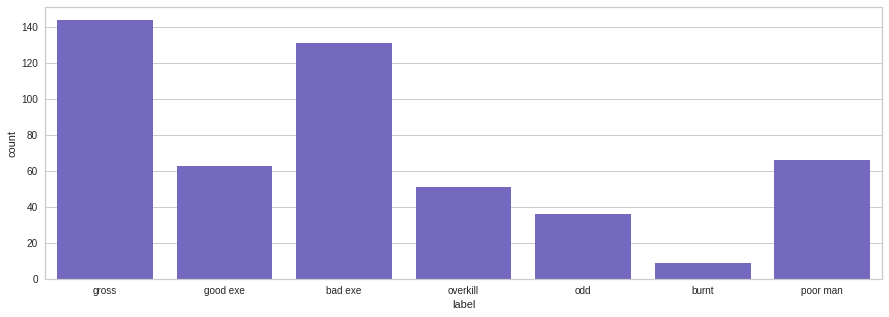

In [ ]:
f = plt.figure(figsize=(15,5))
_ = sns.countplot(x=sfp500_label_df.label, color='slateblue')

# Image Intensity

In [ ]:
# import image data: contains intensity and color channel averages for each image
fp500_image_data_url = 'https://raw.githubusercontent.com/samtbeardsley/Food_Porn/master/Data/fp500_resize_data.csv'
sfp500_image_data_url = 'https://raw.githubusercontent.com/samtbeardsley/Food_Porn/master/Data/sfp500_resize_data.csv'
fp500_image_data = pd.read_csv(fp500_image_data_url)
sfp500_image_data = pd.read_csv(sfp500_image_data_url)

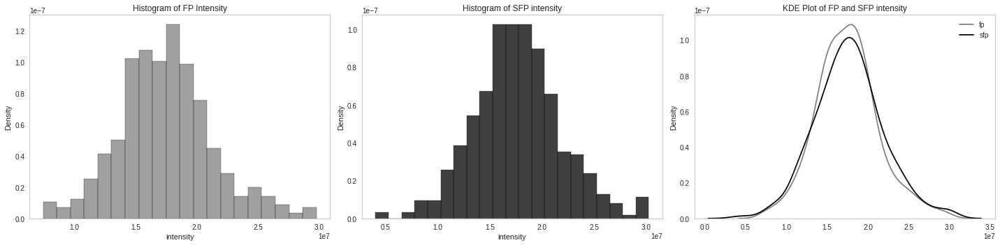

In [ ]:
f = plt.figure(figsize=(20,5))
ax1 = f.add_subplot(131).grid(False) # fp intensity
_ = sns.histplot(fp500_image_data.intensity, color='grey', kde=False, stat='density') 
plt.title('Histogram of FP Intensity')

ax2 = f.add_subplot(132).grid(False) # sfp intensity
_ = sns.histplot(sfp500_image_data.intensity, color='black', kde=False, stat='density') 
_ = plt.title('Histogram of SFP intensity')

ax3 = f.add_subplot(133).grid(False) # kde plots
_ = sns.kdeplot(fp500_image_data.intensity, color='grey')
_ = sns.kdeplot(sfp500_image_data.intensity, color='black')
_ = plt.title('KDE Plot of FP and SFP intensity')
_ = plt.legend(labels=['fp','sfp'],loc='upper right')
_ = plt.xlabel('')
plt.tight_layout()

The intensity histograms show that the FP images are more centered along the spectrum whereas the SFP images have more images towards the tails of the distribution.

# Color Histograms

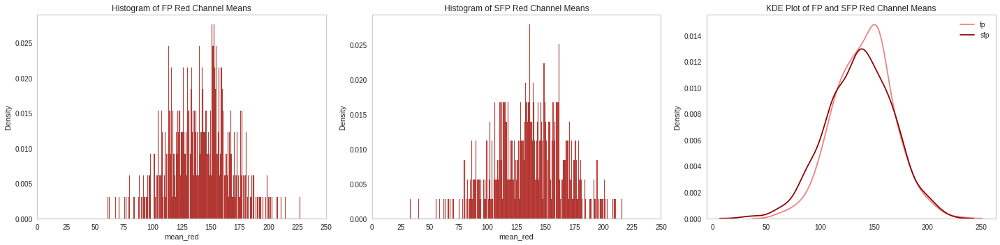

In [ ]:
f = plt.figure(figsize=(20,5))
ax1 = f.add_subplot(131).grid(False) # fp intensity
_ = sns.histplot(fp500_image_data.mean_red, color='r', bins=256, kde=False, stat='density')
_ = plt.title('Histogram of FP Red Channel Means')
_ = plt.xticks(np.arange(0,256,25))

ax2 = f.add_subplot(132).grid(False) # sfp intensity
_ = sns.histplot(sfp500_image_data.mean_red, color='r', bins=256, kde=False, stat='density')
_ = plt.title('Histogram of SFP Red Channel Means')
_ = plt.xticks(np.arange(0,256,25))

ax3 = f.add_subplot(133).grid(False) # kde plots
_ = sns.kdeplot(fp500_image_data.mean_red, gridsize=256, color='lightcoral')
_ = sns.kdeplot(sfp500_image_data.mean_red, gridsize=256, color='darkred')
_ = plt.title('KDE Plot of FP and SFP Red Channel Means')
_ = plt.legend(labels=['fp','sfp'],loc='upper right')
_ = plt.xlabel('')

plt.tight_layout()

FP shows a higher proportion of deeper red values peaking around 155, whereas SFP peaks around 130. SFP has more images in the 50 to 120 range. FP then overtakes through 170 where they then become relatively even in distribution.

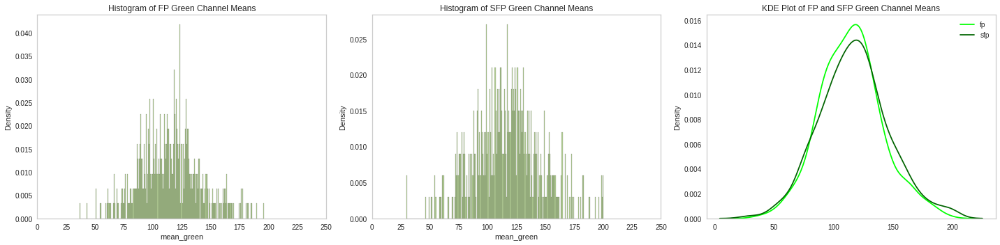

In [ ]:
f = plt.figure(figsize=(20,5))
ax1 = f.add_subplot(131).grid(False) # fp intensity
_ = sns.histplot(fp500_image_data.mean_green, color='g', bins=256, kde=False, stat='density')
_ = plt.title('Histogram of FP Green Channel Means')
_ = plt.xticks(np.arange(0,256,25))

ax2 = f.add_subplot(132).grid(False) # sfp intensity
_ = sns.histplot(sfp500_image_data.mean_green, color='g', bins=256, kde=False, stat='density')
_ = plt.title('Histogram of SFP Green Channel Means')
_ = plt.xticks(np.arange(0,256,25))

ax3 = f.add_subplot(133).grid(False) # kde plots
_ = sns.kdeplot(fp500_image_data.mean_green, gridsize=256, color='lime')
_ = sns.kdeplot(sfp500_image_data.mean_green, gridsize=256, color='darkgreen')
_ = plt.title('KDE Plot of FP and SFP Green Channel Means')
_ = plt.legend(labels=['fp','sfp'],loc='upper right')
_ = plt.xlabel('')
plt.tight_layout()

Both FP and SFP have a similar distribution, however SFP is slightly more distributed with more images at the higher and lower ends of the distribution.

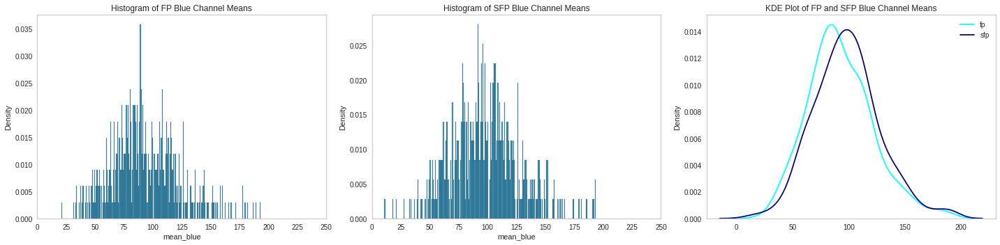

In [ ]:
f = plt.figure(figsize=(20,5))
ax1 = f.add_subplot(131).grid(False) # fp intensity
_ = sns.histplot(fp500_image_data.mean_blue, color='b', bins=256, kde=False, stat='density')
_ = plt.title('Histogram of FP Blue Channel Means')
_ = plt.xticks(np.arange(0,256,25))

ax2 = f.add_subplot(132).grid(False) # sfp intensity
_ = sns.histplot(sfp500_image_data.mean_blue, color='b', bins=256, kde=False, stat='density')
_ = plt.title('Histogram of SFP Blue Channel Means')
_ = plt.xticks(np.arange(0,256,25))

ax3 = f.add_subplot(133).grid(False) # kde plots
_ = sns.kdeplot(fp500_image_data.mean_blue, gridsize=256, color='aqua')
_ = sns.kdeplot(sfp500_image_data.mean_blue, gridsize=256, color='navy')
_ = plt.title('KDE Plot of FP and SFP Blue Channel Means')
_ = plt.legend(labels=['fp','sfp'],loc='upper right')
_ = plt.xlabel('')
plt.tight_layout()

Of all the color channels there is the largest difference within the blue channel. FP images clearly favor less blue with a peak frequency around 80 compared to the SFP peak at 100.

# Average Image

In [ ]:
def get_flatten_image_df(path):
  """generate a dataframe of image file names, and flattened color data - one pixel per column"""
  
  flattened = []
  name = []
  for image in tqdm(os.listdir(path)): # for image in specified path
    img = io.imread(f'{path}/{image}') 
    try: # remove alpha channel if it exists
      img = color.rgba2rgb(img)
      flattened.append(img.ravel())
    except:
      flattened.append(img.ravel())
    name.append(image)

  name_df = pd.DataFrame(data={'path':name})
  flat_df = pd.DataFrame(data={'img_flat':flattened})
  flat_df = pd.DataFrame(flat_df['img_flat'].tolist()) # create one column for each pixel color value
  flattened_df = name_df.merge(flat_df, how='left', left_index=True, right_index=True)

  return flattened_df

In [ ]:
# generate and save flatten FP image data
path = 'drive/My Drive/FoodPorn/FP500_224x224'

fp500_flat = get_flatten_image_df(path)
fp500_flat.to_csv('drive/My Drive/FoodPorn/fp500_flat.csv')

100%|██████████| 500/500 [00:01<00:00, 315.55it/s]


In [ ]:
# generate and save flatten FP image data
path = 'drive/My Drive/FoodPorn/SFP500_224x224'

sfp500_flat = get_flatten_image_df(path)
sfp500_flat.to_csv('drive/My Drive/FoodPorn/sfp500_flat.csv')

100%|██████████| 500/500 [00:01<00:00, 316.52it/s]


In [ ]:
fp500_flat = pd.read_csv('drive/My Drive/FoodPorn/fp500_flat.csv', index_col=0)
sfp500_flat = pd.read_csv('drive/My Drive/FoodPorn/sfp500_flat.csv', index_col=0)

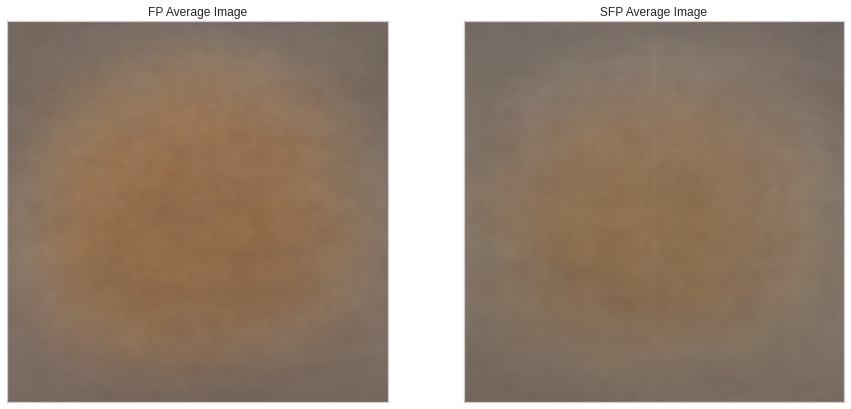

In [ ]:
# Generate FP average image
fp_avg = np.mean(fp500_flat.drop(columns='path'), axis=0) # calculate mean per FP column

length = (len(fp_avg)/3)

fp_avg_red = np.array(fp_avg[:int(length)]).reshape((224,224)) # segment red channel
fp_avg_green = np.array(fp_avg[int(length):int(length*2)]).reshape((224,224)) # segment green channel
fp_avg_blue = np.array(fp_avg[int(length*2):]).reshape((224,224)) # segment blue channel

# combine color channels and reshape 
fp_avg_img = np.array([fp_avg_red, fp_avg_green, fp_avg_blue]).astype('int')
fp_avg_img.resize((224, 224, 3))

# Generate SFP average image
sfp_avg = np.mean(sfp500_flat.drop(columns='path'), axis=0) # calculate mean per SFP columns

length = (len(sfp_avg)/3)

sfp_avg_red = np.array(sfp_avg[:int(length)]).reshape((224,224)) # segment red channel
sfp_avg_green = np.array(sfp_avg[int(length):int(length*2)]).reshape((224,224)) # segment green channel
sfp_avg_blue = np.array(sfp_avg[int(length*2):]).reshape((224,224)) # segment blue channel

# combine color channels and reshape 
sfp_avg_img = np.array([sfp_avg_red, sfp_avg_green, sfp_avg_blue]).astype('int')
sfp_avg_img.resize((224, 224, 3))

# plot average images
fig = plt.figure(figsize=(15,10))
ax1 = fig.add_subplot(121).grid(False)
_ = plt.imshow(fp_avg_img)
_ = plt.xticks([])
_ = plt.yticks([])
_ = plt.title('FP Average Image')

ax2 = fig.add_subplot(122).grid(False)
_ = plt.imshow(sfp_avg_img)
_ = plt.xticks([])
_ = plt.yticks([])
_ = plt.title('SFP Average Image')

The average images shows that FP images take up more of the frame. Additionally the FP average image shows a higher contrast between the center of the image and the outer edges than seen in the SFP average image suggesting that the focus point of SFP images is not as centered.

# Clustering

### FP Clusters

In [ ]:
X_FP = fp500_flat.drop(columns='path')

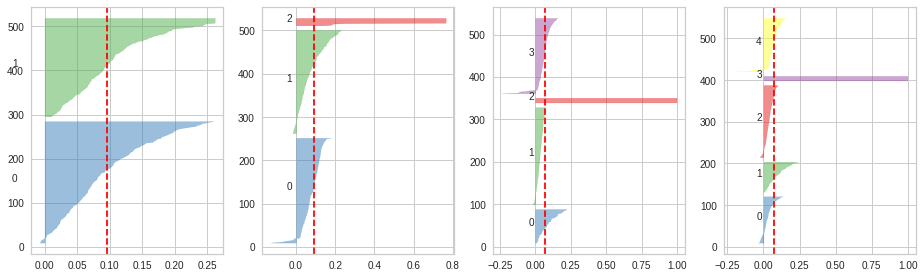

In [ ]:
fig = plt.figure(figsize=(20,10))

for i in range(2,6):
    
    #Create KMeans instance for different number of clusters
    km = KMeans(n_clusters=i, random_state=23)
    ax = fig.add_subplot(2,5,i-1)
    
    #Create and fit SilhouetteVisualizer with KMeans
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax)
    visualizer.fit(X_FP)

Based on the silhouette scores it appears that two clusters will be best.

In [ ]:
fp_km = KMeans(n_clusters=2, random_state=23) # create kmeans with 2 clusters
fp_km.fit(X_FP)

fp_dist = fp_km.transform(X_FP) # transform X to a cluster-distance space

fp_dist = pd.DataFrame({'img':fp500_flat.path, 'dist0':fp_dist[:,0], 'dist1':fp_dist[:,1], 'cluster':fp_km.labels_})
fp_dist.head()

,img,dist0,dist1,cluster
0,7mlve4.jpg,22219.280448,24002.689398,0
1,ctfjt9.jpg,32485.048719,25278.253156,1
2,b1zo3k.jpg,27221.649529,25211.492252,1
3,8jmryh.jpg,28209.974844,29296.388310,0
4,cfwqpq.jpg,22512.669528,21475.992332,1


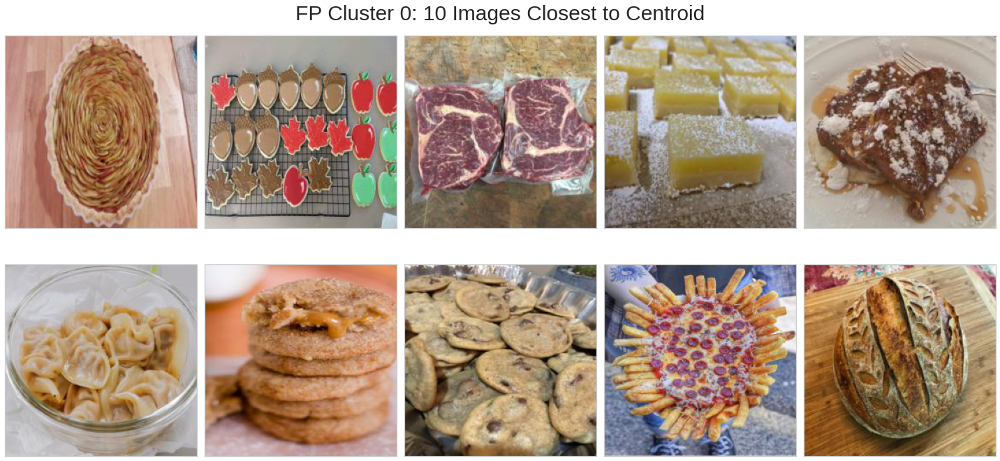

In [ ]:
# subset fp_dist to cluster 0, sort by distance (dist0) and limit to 10 images
closest_cluster0 = fp_dist[['img','dist0']][fp_dist.cluster == 0].sort_values('dist0', ascending=True).head(10)

fig=plt.figure(figsize=(20,10))
axes = []
rows = 2
cols = 5

fp_path = 'drive/My Drive/FoodPorn/FP500_224x224'
fp_list = list(closest_cluster0.img)

for a in range(rows*cols):
    img = io.imread(f'{fp_path}/{fp_list[a]}')
    axes.append(fig.add_subplot(rows, cols, a+1))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
fig.suptitle('FP Cluster 0: 10 Images Closest to Centroid', fontsize=30)
fig.tight_layout()    

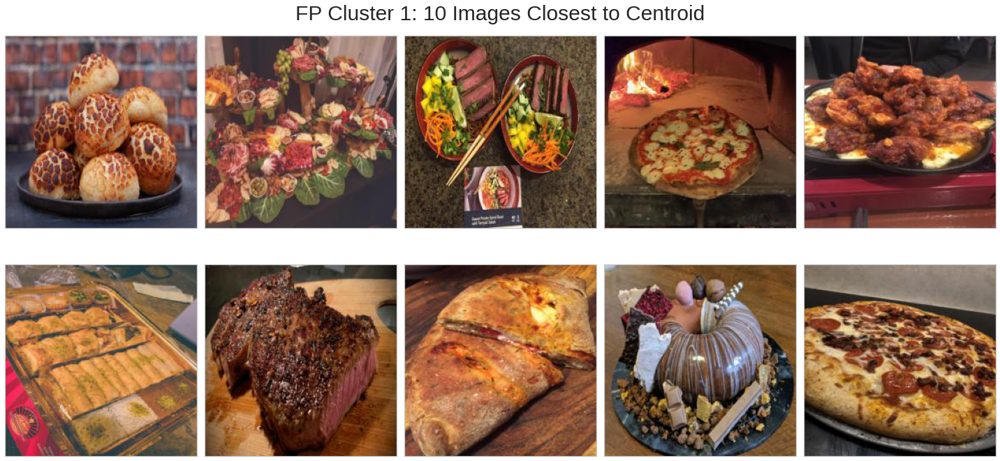

In [ ]:
# subset fp_dist to cluster 1, sort by distance (dist1) and limit to 10 images
closest_cluster1 = fp_dist[['img','dist1']][fp_dist.cluster == 1].sort_values('dist1', ascending=True).head(10)

fig=plt.figure(figsize=(20,10))
axes = []
rows = 2
cols = 5

fp_path = 'drive/My Drive/FoodPorn/FP500_224x224'
fp_list = list(closest_cluster1.img)

for a in range(rows*cols):
    img = io.imread(f'{fp_path}/{fp_list[a]}')
    axes.append(fig.add_subplot(rows, cols, a+1))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
fig.suptitle('FP Cluster 1: 10 Images Closest to Centroid', fontsize=30)
fig.tight_layout()    

The two clusters generated by the Kmeans algorithm are seperated by intesity (total pixel value i.e. lighter or darker) with lower intensity in cluster 0 and higher intensity in cluster 1. Also, by examening the average images by cluster (below) cluster 1 tends to have the item being photographed take up more of the frame.

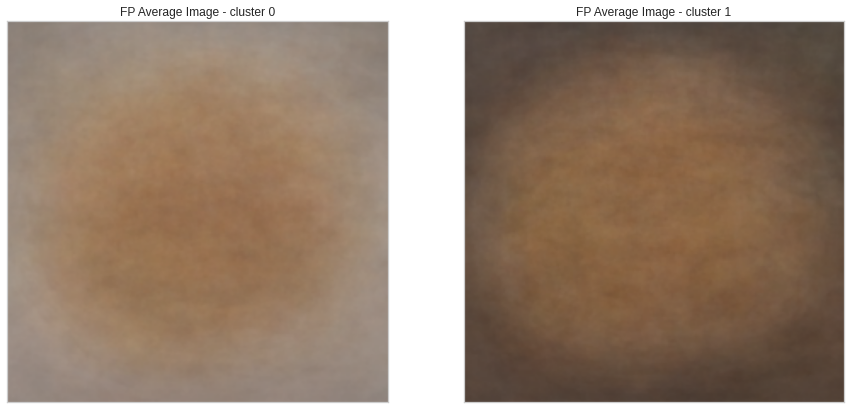

In [ ]:
fp500_flat['cluster'] = fp_km.labels_
fig = plt.figure(figsize=(15,10))

for n in range(0,2):
  # create average image for clusters
  fp_avg_clust = np.mean(fp500_flat[fp500_flat.cluster == n].drop(columns=['path','cluster']), axis=0)

  length = (len(fp_avg_clust)/3)

  fp_avg_red = np.array(fp_avg_clust[:int(length)]).reshape((224,224))
  fp_avg_green = np.array(fp_avg_clust[int(length):int(length*2)]).reshape((224,224))
  fp_avg_blue = np.array(fp_avg_clust[int(length*2):]).reshape((224,224))

  fp_avg_img_clust = np.array([fp_avg_red, fp_avg_green, fp_avg_blue]).astype('int')

  fp_avg_img_clust.resize((224, 224, 3))

  # plot average image per cluster
  ax = fig.add_subplot(1,2,n+1).grid(False)
  _ = plt.imshow(fp_avg_img_clust)
  _ = plt.xticks([])
  _ = plt.yticks([])
  _ = plt.title(f'FP Average Image - cluster {n}')

### SFP Clusters

In [ ]:
X_SFP = sfp500_flat.drop(columns='path')

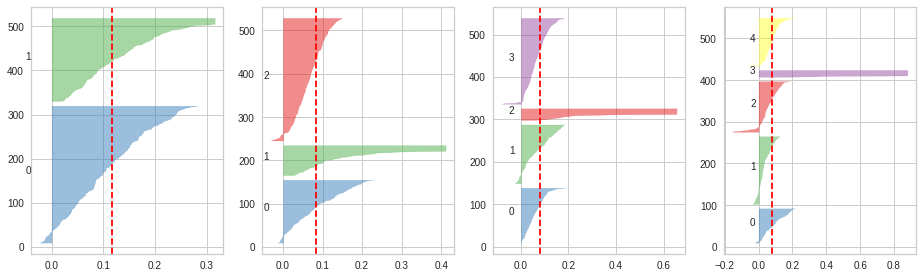

In [ ]:
fig = plt.figure(figsize=(20,10))
for i in range(2,6):
    # Create KMeans instance for different number of clusters
    km = KMeans(n_clusters=i, random_state=23)
    ax = fig.add_subplot(2,5,i-1)
    
    #Create and fit SilhouetteVisualizer with KMeans
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax)
    visualizer.fit(X_SFP)

In [ ]:
sfp_km = KMeans(n_clusters=2, random_state=23) # create kmeans with 2 clusters
sfp_km.fit(X_SFP)

sfp_dist = sfp_km.transform(X_SFP) # transform X to a cluster-distance space

# merge distance with cluster labels and image names
sfp_dist = pd.DataFrame({'img':sfp500_flat.path, 'dist0':sfp_dist[:,0], 'dist1':sfp_dist[:,1], 'cluster':sfp_km.labels_})
sfp_dist.head()

,img,dist0,dist1,cluster
0,ckoiia.jpg,25053.349448,35413.701419,0
1,bylv7c.jpg,22096.947848,28020.588987,0
2,cqjvf5.jpg,30971.500225,45116.445747,0
3,8ui9mb.jpg,19310.453792,34553.246849,0
4,irqx9i.jpg,21010.902616,30068.202588,0


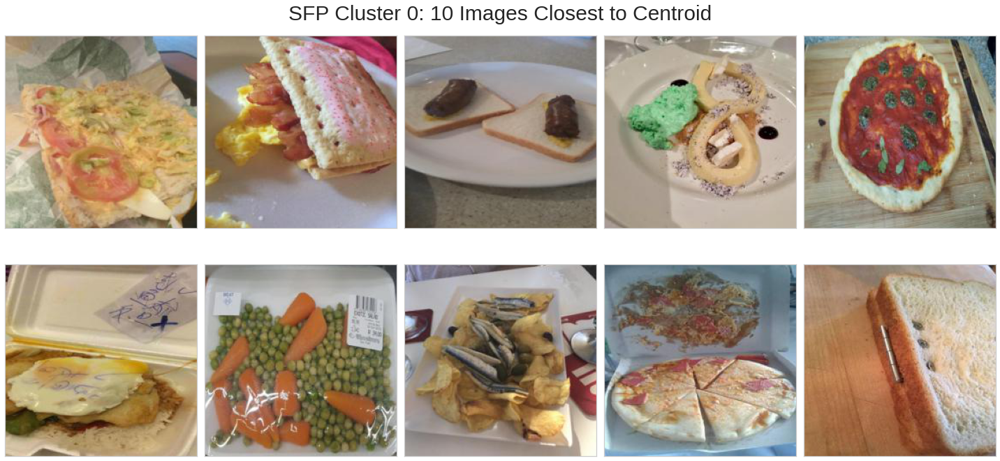

In [ ]:
# subset fp_dist to cluster 0, sort by distance (dist0) and limit to 10 images
closest_cluster0 = sfp_dist[['img','dist0']][sfp_dist.cluster == 0].sort_values('dist0', ascending=True).head(10)

fig=plt.figure(figsize=(20,10))
axes = []
rows = 2
cols = 5

sfp_path = 'drive/My Drive/FoodPorn/SFP500_224x224'
sfp_list = list(closest_cluster0.img)

for a in range(rows*cols):
    img = io.imread(f'{sfp_path}/{sfp_list[a]}')
    axes.append(fig.add_subplot(rows, cols, a+1))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
fig.suptitle('SFP Cluster 0: 10 Images Closest to Centroid', fontsize=30)
fig.tight_layout()    

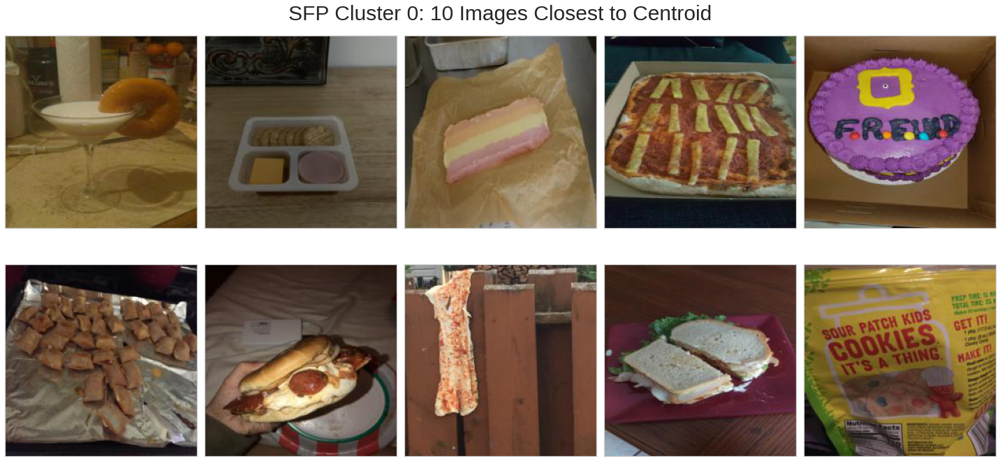

In [ ]:
# subset fp_dist to cluster 0, sort by distance (dist0) and limit to 10 images
closest_cluster1 = sfp_dist[['img','dist1']][sfp_dist.cluster == 1].sort_values('dist1', ascending=True).head(10)

fig=plt.figure(figsize=(20,10))
axes = []
rows = 2
cols = 5

sfp_path = 'drive/My Drive/FoodPorn/SFP500_224x224'
sfp_list = list(closest_cluster1.img)

for a in range(rows*cols):
    img = io.imread(f'{sfp_path}/{sfp_list[a]}')
    axes.append(fig.add_subplot(rows, cols, a+1))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
fig.suptitle('SFP Cluster 0: 10 Images Closest to Centroid', fontsize=30)
fig.tight_layout()    

Like with the FP clusters, the SFP clusters are similarly grouped with lower intensity images in cluster 0 and higher intensity images in cluster 1. Unlike the FP clusters, it is not clear from the average images if the cluster 1 images are taking up more of the frame.

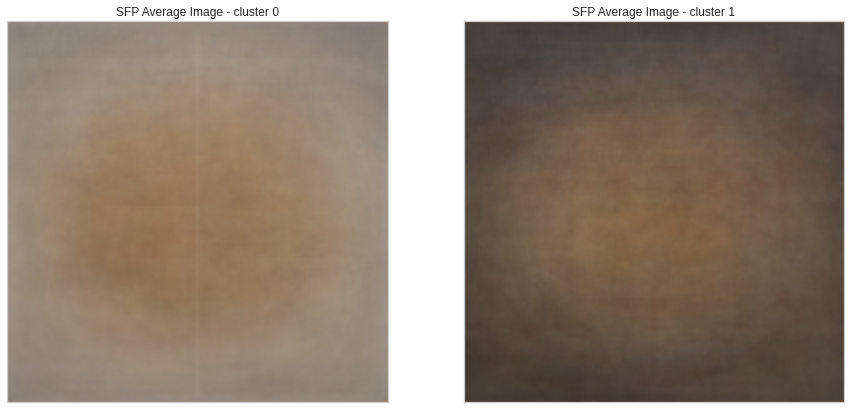

In [ ]:
sfp500_flat['cluster'] = sfp_km.labels_
fig = plt.figure(figsize=(15,10))

for n in range(0,2):
  # create average image for clusters
  sfp_avg_clust = np.mean(sfp500_flat[sfp500_flat.cluster == n].drop(columns=['path','cluster']), axis=0)

  length = (len(sfp_avg_clust)/3)

  sfp_avg_red = np.array(sfp_avg_clust[:int(length)]).reshape((224,224))
  sfp_avg_green = np.array(sfp_avg_clust[int(length):int(length*2)]).reshape((224,224))
  sfp_avg_blue = np.array(sfp_avg_clust[int(length*2):]).reshape((224,224))

  sfp_avg_img_clust = np.array([sfp_avg_red, sfp_avg_green, sfp_avg_blue]).astype('int')

  sfp_avg_img_clust.resize((224, 224, 3))

  # plot average image per cluster
  ax = fig.add_subplot(1,2,n+1).grid(False)
  _ = plt.imshow(sfp_avg_img_clust)
  _ = plt.xticks([])
  _ = plt.yticks([])
  _ = plt.title(f'SFP Average Image - cluster {n}')